In [1]:

import os
os.environ['RAY_DEDUP_LOGS'] = '0'

import numpy as np
import shap
import matplotlib.pyplot as plt
import json

from tempfile import TemporaryDirectory
from typing import List, Dict, Any

import ray
from ray.tune import register_env
from ray.rllib.algorithms.algorithm import Algorithm
from ray.rllib.policy.policy import Policy

from ray.rllib.models import ModelCatalog
from eprllib.examples.example_central_agent_files.policy_model import CustomTransformerModel
ModelCatalog.register_custom_model("custom_transformer", CustomTransformerModel)

from eprllib.Environment.Environment import Environment
from eprllib.Environment.EnvironmentConfig import EnvironmentConfig
from eprllib.AgentsConnectors.FullySharedParametersConnector import FullySharedParametersConnector
from eprllib.Agents.AgentSpec import (
    AgentSpec,
    ObservationSpec,
    RewardSpec,
    ActionSpec,
    TriggerSpec,
    FilterSpec
)
from eprllib.Agents.Filters.FullySharedParametersFilter import FullySharedParametersFilter
from eprllib.Agents.Triggers.WindowsOpeningTriggers import WindowsOpeningTrigger

from eprllib.Agents.Rewards.ASHRAE55SimpleModel import ASHRAE55SimpleModel
from eprllib.examples.example_thermostat_files.episode_fn_VNC import task_cofiguration
from eprllib.examples.example_thermostat_files.policy_mapping import policy_map_fn

from eprllib.PostProcess.Evaluation import generate_experience
from eprllib.AgentsConnectors.BaseConnector import BaseConnector

with open("C:/Users/grhen/Documents/GitHub2/eprllib/src/eprllib/examples/example_thermostat_files/episode_fn_config_VNC.json", "r") as f:
    episode_config = json.load(f)

In [2]:
checkpoint_path = "C:/Users/grhen/ray_results/07_VNC_V/20250825091725_weather_forecast_PPO/weather_forecast_PPO_8cdb5_00000/checkpoint_000002"

In [3]:

"""
Esta configuración debe coincidir con la de entrenamiento.
"""
experiment_name = "07-VNC-V"
name = "weather-forecast"

eprllib_config = EnvironmentConfig()
eprllib_config.generals(
    epjson_path = "C:/Users/grhen/Documents/GitHub2/eprllib/src/eprllib/examples/example_central_agent_files/model.epJSON",
    epw_path = "C:/Users/grhen/Documents/GitHub2/eprllib/src/eprllib/examples/example_central_agent_files/weathers/ESP_PV_San.Sebastian-Igueldo.080270_TMYx.2004-2018.epw",
    output_path = TemporaryDirectory("output","",'C:/Users/grhen/Documents/Resultados_RLforEP').name,
    ep_terminal_output = False,
    timeout = 10,
    evaluation = True,
)

eprllib_config.connector(
    connector_fn = FullySharedParametersConnector,
    connector_fn_config = {
        "number_of_agents_total": 2,
        "number_of_actuators_total": 2
        },
)

eprllib_config.agents(
    agents_config = {
        "North Windows": AgentSpec(
            observation = ObservationSpec(
                variables = [
                    ("Site Outdoor Air Drybulb Temperature", "Environment"),
                    ("Site Wind Speed", "Environment"),
                    ("Site Outdoor Air Relative Humidity", "Environment"),
                    ("Zone Mean Air Temperature", "Thermal Zone"),
                    ("Zone Air Relative Humidity", "Thermal Zone"),
                    ("Zone People Occupant Count", "Thermal Zone"),
                    ("Zone Thermal Comfort ASHRAE 55 Simple Model Summer or Winter Clothes Not Comfortable Time", "Thermal Zone"),
                ],
                simulation_parameters = {
                    'today_weather_horizontal_ir_at_time': True,
                },
                meters = [
                    "Electricity:Building",
                    # "Heating:DistrictHeatingWater",
                    # "Cooling:DistrictCooling",
                ],
                use_actuator_state = True,
                use_one_day_weather_prediction = True,
                prediction_hours = 24,
                prediction_variables = {
                    'outdoor_dry_bulb': True,
                },
                internal_variables = [
                    ("Zone Floor Area", "Thermal Zone"),
                ],
                history_len=6,
                user_occupation_funtion = True,
                occupation_schedule = ("Schedule:Constant", "Schedule Value", "occupancy_schedule"),
                user_occupation_forecast = False
            ),
            action = ActionSpec(
                actuators = [
                    ("AirFlow Network Window/Door Opening", "Venting Opening Factor", "window_north"),
                ],
            ),
            filter= FilterSpec(
                filter_fn = FullySharedParametersFilter,
                filter_fn_config = {},
            ),
            trigger= TriggerSpec(
                trigger_fn = WindowsOpeningTrigger,
                trigger_fn_config = {
                    'window_actuator': ("AirFlow Network Window/Door Opening", "Venting Opening Factor", "window_north")
                },
            ),
            reward = RewardSpec(
                reward_fn = ASHRAE55SimpleModel,
                reward_fn_config = {
                    "thermal_zone": "Thermal Zone",
                },
            ),
        ),
        "South Windows": AgentSpec(
            observation = ObservationSpec(
                variables = [
                    ("Site Outdoor Air Drybulb Temperature", "Environment"),
                    ("Site Wind Speed", "Environment"),
                    ("Site Outdoor Air Relative Humidity", "Environment"),
                    ("Zone Mean Air Temperature", "Thermal Zone"),
                    ("Zone Air Relative Humidity", "Thermal Zone"),
                    ("Zone People Occupant Count", "Thermal Zone"),
                    ("Zone Thermal Comfort ASHRAE 55 Simple Model Summer or Winter Clothes Not Comfortable Time", "Thermal Zone"),
                ],
                simulation_parameters = {
                    'today_weather_horizontal_ir_at_time': True,
                },
                meters = [
                    "Electricity:Building",
                    # "Heating:DistrictHeatingWater",
                    # "Cooling:DistrictCooling",
                ],
                use_actuator_state = True,
                use_one_day_weather_prediction = True,
                prediction_hours = 24,
                prediction_variables = {
                    'outdoor_dry_bulb': True,
                },
                internal_variables = [
                    ("Zone Floor Area", "Thermal Zone"),
                ],
                history_len=6,
                user_occupation_funtion = True,
                occupation_schedule = ("Schedule:Constant", "Schedule Value", "occupancy_schedule"),
                user_occupation_forecast = False
            ),
            action = ActionSpec(
                actuators = [
                    ("AirFlow Network Window/Door Opening", "Venting Opening Factor", "window_south"),
                ],
            ),
            filter= FilterSpec(
                filter_fn = FullySharedParametersFilter,
                filter_fn_config = {},
            ),
            trigger= TriggerSpec(
                trigger_fn = WindowsOpeningTrigger,
                trigger_fn_config = {
                    'window_actuator': ("AirFlow Network Window/Door Opening", "Venting Opening Factor", "window_south")
                },
            ),
            reward = RewardSpec(
                reward_fn = ASHRAE55SimpleModel,
                reward_fn_config = {
                    "thermal_zone": "Thermal Zone",
                },
            ),
        )
    }
)

eprllib_config.episodes(
    episode_fn = task_cofiguration,
    episode_fn_config = episode_config
)

assert eprllib_config.agents_config is not None, "Agents configuration is not defined."

number_of_agents = len([keys for keys in eprllib_config.agents_config.keys()])
ray.init(_temp_dir='C:/Users/grhen/ray_results/tmp')
register_env(name="EPEnv", env_creator=lambda args: Environment(args))
env_config = eprllib_config.to_dict()

old_algo = Algorithm.from_checkpoint(checkpoint_path)

2025-08-28 10:38:15,787	INFO worker.py:1918 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 
c:\Users\grhen\Documents\GitHub2\eprllib\eprllib-dev\lib\site-packages\ray\rllib\algorithms\algorithm.py:520: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  return UnifiedLogger(config, logdir, loggers=None)
c:\Users\grhen\Documents\GitHub2\eprllib\eprllib-dev\lib\site-packages\ray\tune\logger\unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))

(RolloutWorker pid=5572) Temporary directory for models: C:\Users\grhen\AppData\Local\Temp
(RolloutWorker pid=39308) Temporary directory for models: C:\Users\grhen\AppData\Local\Temp
(RolloutWorker pid=23208) Temporary directory for models: C:\Users\grhen\AppData\Local\Temp
(RolloutWorker pid=21836) Temporary directory for models: C:\Users\grhen\AppData\Local\Temp
(RolloutWorker pid=34028) Temporary directory for models: C:\Users\grhen\AppData\Local\Temp
(RolloutWorker pid=12268) Temporary directory for models: C:\Users\grhen\AppData\Local\Temp
(RolloutWorker pid=33220) Temporary directory for models: C:\Users\grhen\AppData\Local\Temp
Temporary directory for models: C:\Users\grhen\AppData\Local\Temp


2025-08-28 10:38:53,207	INFO trainable.py:161 -- Trainable.setup took 33.758 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2025-08-28 10:38:53,210	WARNING util.py:61 -- Install gputil for GPU system monitoring.


Temporary directory for models: C:\Users\grhen\AppData\Local\Temp


In [4]:
# ray.shutdown()

In [5]:
single_policy = old_algo.get_policy("single_policy")

# Generate experience
df = generate_experience(
    env = Environment,
    env_config = env_config,
    policies = {
        "North Windows": single_policy,
        "South Windows": single_policy,
    },
    num_episodes = 1
)

old_algo.stop()
ray.shutdown()

In [6]:
feature_names: Dict[str, List[str]] = {agent: [] for agent in env_config["agents_config"].keys()}
feature_names_index: Dict[str, Dict[str, int]] = {agent: {} for agent in env_config["agents_config"].keys()}
connector_fn: BaseConnector = env_config['connector_fn'](env_config["connector_fn_config"])
for agent in env_config["agents_config"].keys():
    connector_fn.get_agent_obs_dim(env_config,agent)
    feature_names_index[agent] = connector_fn.get_agent_obs_indexed(env_config,agent)
    for key in feature_names_index[agent].keys():
        feature_names[agent].append(key)
for agent in feature_names.keys():
    if env_config["agents_config"][agent]["observation"]["history_len"] > 1:
        for h in range(env_config["agents_config"][agent]["observation"]["history_len"]):
            feature_names_h = feature_names[agent].copy()
            feature_names_h_new: List[str] = []
            for value in feature_names_h:
                feature_names_h_new.append(f"h{h}_{value}")
            feature_names[agent].extend(feature_names_h_new)

In [10]:
feature_names

{'North Windows': ['North Windows',
  'South Windows',
  'North Windows: Site Outdoor Air Drybulb Temperature: Environment',
  'North Windows: Site Wind Speed: Environment',
  'North Windows: Site Outdoor Air Relative Humidity: Environment',
  'North Windows: Zone Mean Air Temperature: Thermal Zone',
  'North Windows: Zone Air Relative Humidity: Thermal Zone',
  'North Windows: Zone People Occupant Count: Thermal Zone',
  'North Windows: Zone Thermal Comfort ASHRAE 55 Simple Model Summer or Winter Clothes Not Comfortable Time: Thermal Zone',
  'North Windows: Zone Floor Area: Thermal Zone',
  'North Windows: Electricity:Building',
  'North Windows: outdoor_dry_bulb: 1',
  'North Windows: outdoor_dry_bulb: 2',
  'North Windows: outdoor_dry_bulb: 3',
  'North Windows: outdoor_dry_bulb: 4',
  'North Windows: outdoor_dry_bulb: 5',
  'North Windows: outdoor_dry_bulb: 6',
  'North Windows: outdoor_dry_bulb: 7',
  'North Windows: outdoor_dry_bulb: 8',
  'North Windows: outdoor_dry_bulb: 9',
 

In [7]:
df

{'experiment': {'episode_1': {'timestep_1': {'North Windows': {'observation': array([[  1.        ,   0.        ,  16.633333  ,   0.41666666,
              60.333332  ,  16.801651  ,  57.70365   ,   1.        ,
               0.        ,  20.        ,   0.        , 331.66666   ,
              20.066668  ,  18.666666  ,  17.366667  ,  16.566668  ,
              15.816667  ,  15.366667  ,  15.4       ,  16.733334  ,
              18.766666  ,  20.983334  ,  22.983334  ,  23.483334  ,
              23.95      ,  24.2       ,  24.15      ,  23.85      ,
              23.483334  ,  22.75      ,  21.8       ,  20.633333  ,
              19.583334  ,  18.283333  ,  16.983334  ,  15.833333  ,
               0.        ,   0.        ],
            [  1.        ,   0.        ,  16.633333  ,   0.41666666,
              60.333332  ,  16.801651  ,  57.70365   ,   1.        ,
               0.        ,  20.        ,   0.        , 331.66666   ,
              20.066668  ,  18.666666  ,  17.366667  ,  1

In [8]:
# for agent in feature_names_index.keys():
#     energy_total: List[float] = []
#     for timestep in range(1,len(df["experiment"]["episode_1"])):
#         energy_total.append(df["experiment"]["episode_1"][f"timestep_{timestep}"][agent]["observation"][feature_names_index[agent][f"{agent}: Heating:DistrictHeatingWater"]])
#         energy_total.append(df["experiment"]["episode_1"][f"timestep_{timestep}"][agent]["observation"][feature_names_index[agent][f"{agent}: Cooling:DistrictCooling"]])
#     print(sum(energy_total)/3600000)

Agent: North Windows


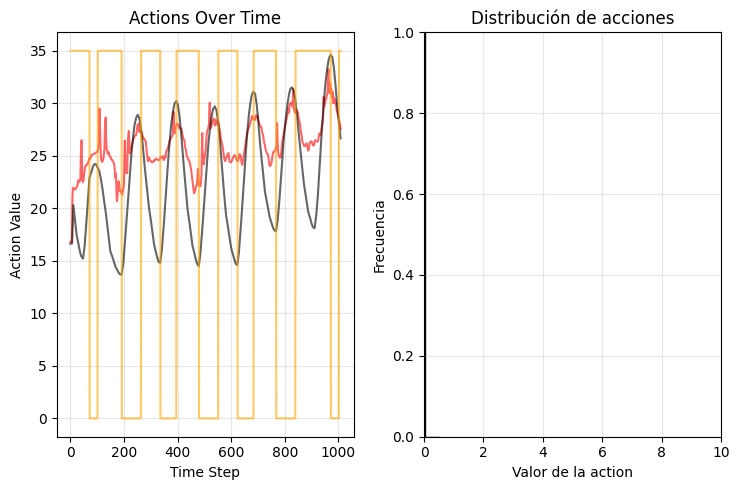


Statistical Summary:
Mean: 0.00
Median: 0.00
Std Dev: 0.00
Min: 0.00
Max: 0.00
Agent: South Windows


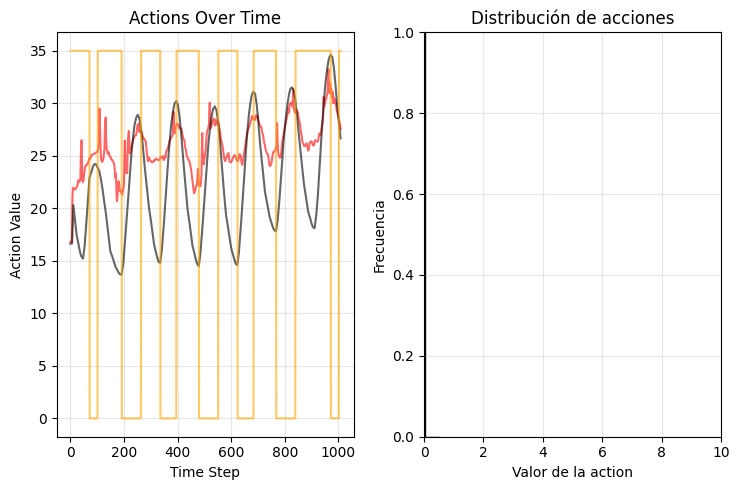


Statistical Summary:
Mean: 0.00
Median: 0.00
Std Dev: 0.00
Min: 0.00
Max: 0.00


In [12]:
for agent in feature_names_index.keys():
    for timestep in range(1,len(df["experiment"]["episode_1"])):
        action_list = df["experiment"]["episode_1"][f"timestep_{timestep}"][agent]["action"]
    t_i_list: List[float] = []
    occ_list: List[float] = []
    t_out_list: List[float] = []
    for timestep in range(1,len(df["experiment"]["episode_1"])):
        t_i_list.append(df["experiment"]["episode_1"][f"timestep_{timestep}"][agent]["observation"][0][feature_names_index[agent][f"{agent}: Zone Mean Air Temperature: Thermal Zone"]])
        t_out_list.append(df["experiment"]["episode_1"][f"timestep_{timestep}"][agent]["observation"][0][feature_names_index[agent][f"{agent}: Site Outdoor Air Drybulb Temperature: Environment"]])
        occ_list.append(df["experiment"]["episode_1"][f"timestep_{timestep}"][agent]["observation"][0][feature_names_index[agent][f"{agent}: Zone People Occupant Count: Thermal Zone"]]*35)
    
    print(f"Agent: {agent}")
    
    # Create a figure with multiple subplots
    plt.figure(figsize=(7.5, 5))

    # 1. Time series plot
    plt.subplot(1, 2, 1)
    plt.plot(action_list, label='Actions', color='blue', alpha=0.6)
    plt.plot(t_i_list, label='Ti', color='red', alpha=0.6)
    plt.plot(t_out_list, label='To', color='black', alpha=0.6)
    # plt.plot(t_max, label='Ti', color='black', alpha=0.6)
    # plt.plot(t_min, label='Ti', color='black', alpha=0.6)
    plt.plot(occ_list, label='Occupancy', color='orange', alpha=0.6)
    plt.title('Actions Over Time')
    plt.xlabel('Time Step')
    plt.ylabel('Action Value')
    plt.grid(True, alpha=0.3)

    # 2. Histogram
    plt.subplot(1, 2, 2)
    plt.hist(action_list, bins=11, color='skyblue', edgecolor='black')
    plt.title('Distribución de acciones')
    plt.xlabel('Valor de la action')
    plt.xlim((0, 10))
    plt.ylabel('Frecuencia')
    plt.ylim((0, 1))
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Basic statistical analysis
    print("\nStatistical Summary:")
    print(f"Mean: {np.mean(action_list):.2f}")
    print(f"Median: {np.median(action_list):.2f}")
    print(f"Std Dev: {np.std(action_list):.2f}")
    print(f"Min: {np.min(action_list):.2f}")
    print(f"Max: {np.max(action_list):.2f}")

    # # Check for stationarity
    # lag_acf = acorr_lm(action_list, nlags=20)

    # plt.figure(figsize=(10, 4))
    # plt.plot(lag_acf)
    # plt.title('Autocorrelation Function')
    # plt.xlabel('Lag')
    # plt.ylabel('ACF')
    # plt.grid(True, alpha=0.3)
    # plt.show()


In [ ]:
# # Create a figure with multiple subplots
# plt.figure(figsize=(15.5, 5))

# # Histogram
# plt.hist(action_list, bins=30, color='skyblue', edgecolor='black')
# plt.title('Distribución de acciones')
# plt.xlabel('Valor de la action')
# plt.ylabel('Frecuencia')
# plt.grid(True, alpha=0.3)

# plt.tight_layout()
# plt.show()

In [ ]:
# # Scatter plot of the variables action_list = df[agent]["actions"] vs cooling_energy = []
# action_list = df[agent]["actions"]
# cooling_energy = []
# for timestep in range(len(df[agent]["infos"])-1):
#     cooling_energy.append(df[agent]["infos"][timestep][f"{agent}: Cooling:DistrictCooling"])

# plt.figure(figsize=(7.5, 5))
# plt.scatter(action_list, cooling_energy, s=1)
# plt.xlabel("Action")
# plt.ylabel("Cooling energy")
# plt.title("Scatter plot of Action vs Cooling energy")
# plt.grid(True, alpha=0.3)
# plt.show()

In [ ]:
# # Analyze transitions between actions
# transitions = np.diff(action_list)
# plt.figure(figsize=(10, 4))
# plt.plot(transitions, label='Action Changes')
# plt.title('Action Transitions Over Time')
# plt.xlabel('Time Step')
# plt.ylabel('Change in Action')
# plt.grid(True, alpha=0.3)
# plt.show()

# # Calculate transition statistics
# print("\nTransition Analysis:")
# print(f"Mean absolute change: {np.mean(np.abs(transitions)):.2f}")
# print(f"Max increase: {np.max(transitions):.2f}")
# print(f"Max decrease: {np.min(transitions):.2f}")


In [ ]:
# # Create a figure with multiple subplots
# plt.figure(figsize=(15, 5))

# # 1. Time series plot
# plt.scatter(action_list, occ_list, color='blue', alpha=0.6)
# plt.title('Action-occupancy distribution')
# plt.xlabel('Action Value')
# plt.ylabel('Occupancy')
# plt.grid(True, alpha=0.3)

In [ ]:
from typing import List, Any, Optional
data_obs_list: List[Any] = []
for timestep in range(1,len(df["experiment"]["episode_1"])):
    data_obs_list.append(df["experiment"]["episode_1"][f"timestep_{timestep}"][agent]["observation"])
        
data_obs = np.array(data_obs_list)

In [ ]:
print(data_obs.shape)

(1009, 38)


In [ ]:
from numpy.typing import NDArray
from numpy import float32
import torch
# Model prediction function (adapted for RLlib)
POLICY: Optional[Policy] = None
def model_predict(
    data: NDArray[float32],
):
    # Transform the lists in tensors.
    obs_tensor = torch.tensor(data, dtype=torch.float32)
    
    # Compute the actions.
    with torch.no_grad():
        predictions = POLICY.compute_actions(
            obs_batch=obs_tensor.numpy(), 
            exploration=False, 
        )[0]
    return predictions

In [ ]:
# Use KernelExplainer
data_obs_sample = shap.sample(data_obs, 100)

POLICY = single_policy
explainer = shap.KernelExplainer(
    model_predict,
    data=data_obs_sample,
    feature_names=feature_names
    )

In [ ]:
shap_values_1 = explainer(background_data_np_sample)

In [ ]:
"""
Global bar plot
================

Passing a matrix of SHAP values to the bar plot function creates a global feature importance 
plot, where the global importance of each feature is taken to be the mean absolute value for 
that feature over all the given samples.

# By default the bar plot only shows a maximum of ten bars, but this can be controlled with the `max_display` parameter.
"""
shap.plots.bar(shap_values_1, max_display=23)

In [ ]:
# for _ in range(50):
#     shap.plots.bar(shap_values_1[_], max_display=13)

In [ ]:
"""
beeswarm summary plot
======================

The beeswarm plot is designed to display an information-dense summary of how the top features 
in a dataset impact the model’s output. Each instance the given explanation is represented by 
a single dot on each feature row. The x position of the dot is determined by the SHAP value 
(shap_values.value[instance,feature]) of that feature, and dots “pile up” along each feature row 
to show density. Color is used to display the original value of a feature 
(shap_values.data[instance,feature]).

By default the maximum number of features shown is ten, but this can be adjusted with the max_display parameter.
"""
shap.plots.beeswarm(shap_values_1, max_display=6)

In [ ]:
"""
Feature ordering
=================

By default the features are ordered using shap_values.abs.mean(0), which is the mean absolute value 
of the SHAP values for each feature. This order however places more emphasis on broad average impact, 
and less on rare but high magnitude impacts. If we want to find features with high impacts for individual 
people we can instead sort by the max absolute value.
"""
shap.plots.beeswarm(shap_values_1, max_display=6, order=shap_values_1.abs.max(0))

In [ ]:
"""
Sometimes it is helpful to transform the SHAP values before we plots them. Below we plot the absolute 
value and fix the color to be red. This creates a richer parallel to the standard shap_values.abs.mean(0) 
bar plot, since the bar plot just plots the mean value of the dots in the beeswarm plot.
"""
shap.plots.beeswarm(shap_values_1.abs, max_display=23, color="shap_red")

In [ ]:
"""
A simple violin summary plot
=============================

The violin summary plot offers a compact representation of the distribution and variability of SHAP 
values for each feature. Individual violin plots are stacked by importance of the particular feature 
on model output (sum of the absolute values of the SHAP values per feature).

Violin plots use “violin-shaped” figures to display the distribution and density of SHAP values for their 
respective feature. The violins can therefore provide insights into the range, variability, skewness, 
symmetry, and multimodality of the SHAP value distribution for a specific feature.

The overall violin summary plot allow for comparisons in feature importance. Wider violins indicate higher 
density and more frequent values, thus providing insights into the relative importance of each feature with 
regard to the model output.
"""
shap.plots.violin(shap_values_1, max_display=23)

In [ ]:
"""
Simple dependence scatter plot
===============================

A dependence scatter plot shows the effect a single feature has on the predictions made by the model.

* Each dot is a single prediction (row) from the dataset.
* The x-axis is the value of the feature (from the X matrix, stored in explanation.data).
* The y-axis is the SHAP value for that feature (stored in explanation.values), which represents how much knowing 
that feature’s value changes the output of the model for that sample’s prediction. For this model the units are 
log-odds of making over 50k annually.
* The light grey area at the bottom of the plot is a histogram showing the distribution of data values.
"""

features = feature_names.copy()

# for feature in features:
#     shap.plots.scatter(
#         shap_values_1[:, feature],
#         # color=shap_values_1[:, "Zone Thermal Comfort Fanger Model PMV"]
#         )

In [ ]:

# # for feature in features:
# features_copy = features.copy()
# features_copy.remove("Estado del actuador")
# for feature2 in features_copy:
#     shap.plots.scatter(
#         shap_values_1[:, "Estado del actuador"],
#         color=shap_values_1[:, feature2]
#         )

In [ ]:
shap.plots.scatter(
    shap_values_1[:, "Energía para enfriamiento"],
    color=shap_values_1[:, "Temperatura de bulbo seco"]
    )

In [ ]:
"""
Heatmap
========

Passing a matrix of SHAP values to the heatmap plot function creates a plot with the instances on the x-axis, 
the model inputs on the y-axis, and the SHAP values encoded on a color scale. By default the samples are ordered 
using shap.order.hclust, which orders the samples based on a hierarchical clustering by their explanation 
similarity. This results in samples that have the same model output for the same reason getting grouped together 
(such as people with a high impact from capital gain in the plot below).

The output of the model is shown above the heatmap matrix (centered around the explaination’s .base_value), and 
the global importance of each model input shown as a bar plot on the right hand side of the plot (by default this 
is the shap.order.abs.mean measure of overall importance).
"""
shap.plots.heatmap(shap_values_1, max_display=23)

In [ ]:
# for i in range(len(background_data_np_sample)):
#     shap.initjs()
#     shap.force_plot(explainer.expected_value, shap_values[i], background_data_np_sample[i], matplotlib=True, show=True)

# for i in range(14):
#     shap.dependence_plot(i, shap_values, background_data_np_sample)

In [ ]:
# Parameter importance

# import eli5
# from eli5.sklearn import PermutationImportance

# val_X = df["observations"][0:100]
# val_y = df["actions"][0:100]

# perm = PermutationImportance(model_predict, random_state=1).fit(val_X, val_y)
# eli5.show_weights(perm, feature_names = val_X.columns.tolist())